In [64]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython import display
import warnings
import seaborn as sns
import ehrapy as ep
import anndata as ad

plt.style.use("ggplot")
warnings.filterwarnings("ignore")

# Benchmark dataset creation
# https://github.com/YerevaNN/mimic3-benchmarks
#https://github.com/cmsalgado/book_chapter/blob/master/book_chapter.ipynb

In [44]:
df = pd.read_csv('notebooks/ehrapy_data/icd_chart_60filtered.csv.gz')


In [73]:
df

,stay_id,itemid,event_time_from_admit,valuenum,label,category,unitname
0,39698942,220045,0 days 12:09:57,128.0,Heart Rate,Routine Vital Signs,bpm
1,39698942,220210,0 days 12:09:57,18.0,Respiratory Rate,Respiratory,insp/min
2,39698942,220179,0 days 12:11:57,72.0,Non Invasive Blood Pressure systolic,Routine Vital Signs,mmHg
3,39698942,220180,0 days 12:11:57,27.0,Non Invasive Blood Pressure diastolic,Routine Vital Signs,mmHg
4,39698942,220181,0 days 12:11:57,34.0,Non Invasive Blood Pressure mean,Routine Vital Signs,mmHg
...,...,...,...,...,...,...,...
8104512,31070865,225624,0 days 19:37:00,48.0,BUN,Labs,NaN
8104513,31070865,227073,0 days 19:37:00,13.0,Anion gap,Labs,NaN
8104514,31070865,227442,0 days 19:37:00,4.3,Potassium (serum),Labs,NaN
8104515,31070865,227443,0 days 19:37:00,21.0,HCO3 (serum),Labs,NaN


In [45]:
df2 = pd.read_csv('notebooks/ehrapy_data/icu_stay_diag.csv.gz')

In [46]:
cluster_df = pd.read_csv('notebooks/tables/leiden_clusters.csv')
cluster_df = cluster_df.reset_index()

df3 = df2.merge(cluster_df[["stay_id", "leiden_0_3", 'annotation']], on="stay_id")

In [47]:
# pivot our table wide
wide_df = df.pivot_table(
    index=["stay_id", "event_time_from_admit"],
    columns="label",
    values="valuenum",
    aggfunc="first"  # or "mean" if multiple values per label per time
).reset_index()


In [48]:
wide_df

label,stay_id,event_time_from_admit,ALT,AST,Admission Weight (Kg),Alkaline Phosphate,Anion gap,BUN,Calcium non-ionized,Chloride (serum),...,PTT,Phosphorous,Platelet Count,Potassium (serum),Prothrombin time,Respiratory Rate,Sodium (serum),Temperature Fahrenheit,Total Bilirubin,WBC
0,30000484,-1 days +19:57:28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,14.8,NaN,NaN,NaN,NaN,NaN
1,30000484,-1 days +23:59:28,NaN,NaN,68.5,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,30000484,0 days 01:14:28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,22.0,NaN,NaN,NaN,NaN
3,30000484,0 days 01:20:28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,30000484,0 days 01:21:28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,96.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1981896,39999230,8 days 15:57:32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1981897,39999230,8 days 17:26:32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,25.0,NaN,NaN,NaN,NaN
1981898,39999230,8 days 17:28:32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,19.0,NaN,97.4,NaN,NaN
1981899,39999230,8 days 17:34:32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [49]:
# Create dictionaries for metadata (label → unit/category)
unit_lookup = df.dropna(subset=["unitname"]).drop_duplicates(subset=["label"])[["label", "unitname"]].set_index("label").to_dict()["unitname"]
category_lookup = df.drop_duplicates(subset=["label"])[["label", "category"]].set_index("label").to_dict()["category"]


In [50]:
unit_lookup["Heart Rate"]  # → 'bpm'
category_lookup["Respiratory Rate"]  # → 'Respiratory'


'Respiratory'

In [51]:
# Join on stay_id
merged_wide = df3.merge(wide_df, on="stay_id", how="left")


In [52]:
# Step 1: Ensure it's timedelta
merged_wide["event_time_from_admit"] = pd.to_timedelta(merged_wide["event_time_from_admit"])

# Step 2: Convert to total hours
merged_wide["hours_since_admit"] = merged_wide["event_time_from_admit"].dt.total_seconds() / 3600

# Step 3: Clip negative values to 0
merged_wide["hours_since_admit"] = merged_wide["hours_since_admit"].clip(lower=0)



In [53]:
merged_wide["day"] = merged_wide["event_time_from_admit"].dt.days + 1


In [54]:
merged_wide

,subject_id,stay_id,intime,outtime,Age,gender,ethnicity,insurance,hospital_death,dod,...,Platelet Count,Potassium (serum),Prothrombin time,Respiratory Rate,Sodium (serum),Temperature Fahrenheit,Total Bilirubin,WBC,hours_since_admit,day
0,10001843,39698942,2134-12-05 18:50:03,2134-12-06 14:38:26,73,M,WHITE,Medicare,1,2134-12-06 00:00:00,...,NaN,4.3,23.4,NaN,138.0,NaN,4.2,NaN,0.000000,0
1,10001843,39698942,2134-12-05 18:50:03,2134-12-06 14:38:26,73,M,WHITE,Medicare,1,2134-12-06 00:00:00,...,551.0,NaN,NaN,NaN,NaN,NaN,NaN,13.8,0.000000,0
2,10001843,39698942,2134-12-05 18:50:03,2134-12-06 14:38:26,73,M,WHITE,Medicare,1,2134-12-06 00:00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0
3,10001843,39698942,2134-12-05 18:50:03,2134-12-06 14:38:26,73,M,WHITE,Medicare,1,2134-12-06 00:00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.049167,1
4,10001843,39698942,2134-12-05 18:50:03,2134-12-06 14:38:26,73,M,WHITE,Medicare,1,2134-12-06 00:00:00,...,NaN,NaN,NaN,17.0,NaN,NaN,NaN,NaN,0.065833,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1981896,19999625,31070865,2139-10-10 19:18:00,2139-10-11 18:21:28,81,M,WHITE,Medicare,0,0,...,NaN,4.3,NaN,NaN,146.0,NaN,NaN,NaN,19.616667,1
1981897,19999625,31070865,2139-10-10 19:18:00,2139-10-11 18:21:28,81,M,WHITE,Medicare,0,0,...,NaN,NaN,NaN,17.0,NaN,NaN,NaN,NaN,19.700000,1
1981898,19999625,31070865,2139-10-10 19:18:00,2139-10-11 18:21:28,81,M,WHITE,Medicare,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.133333,1
1981899,19999625,31070865,2139-10-10 19:18:00,2139-10-11 18:21:28,81,M,WHITE,Medicare,0,0,...,NaN,NaN,NaN,18.0,NaN,99.5,NaN,NaN,20.700000,1


In [55]:
merged_wide = merged_wide.drop(columns=["event_time_from_admit"])


In [56]:
adata = ep.io.df_to_anndata(merged_wide, 
            index_column='stay_id',
            columns_obs_only=['stay_id', 'subject_id', 'hadm_id', 'dod', 'intime', 'outtime', 'ALT', 'AST', 'ICD_J18', 'ICD_E87', 'ICD_I50', 'ICD_N17', 'ICD_J96', 'gender', 'insurance', 'ethnicity',  'annotation', 'icu_stay_days', 'los'])


In [57]:
data = adata.to_df()
data.index = data.index.astype(int)

In [58]:
print(f"Number of ICU stays: {str(len(data.index.unique()))}")
print(f"Number of survivors: {str(len(data[data['hospital_death']==0].index.unique()))}")
print(f"Number of non-survivors: {str(len(data[data['hospital_death']==1].index.unique()))}")
print(
    f"Mortality: {str(round(100*len(data[data['hospital_death']==1].index.unique()) / len(data.index.unique()),1))}%"
)

Number of ICU stays: 9864
Number of survivors: 8514
Number of non-survivors: 1350
Mortality: 13.7%


! Features 'hospital_death', 'leiden_0_3', 'BUN', 'Respiratory Rate' were detected as categorical features stored numerically.Please verify and correct using `ep.ad.replace_feature_types` if necessary.
! Feature types were inferred and stored in adata.var[feature_type]. Please verify using `ep.ad.feature_type_overview` and adjust if necessary using `ep.ad.replace_feature_types`.
Finished one-hot enc… 1…0m


In [62]:
ep.ad.replace_feature_types(adata, ['BUN', 'Respiratory Rate'], 'numeric')
#ep.ad.replace_feature_types(adata, ['day'], 'categorical')

In [ ]:
ep.ad.infer_feature_types(adata)

In [65]:
adata = ep.pp.encode(
    adata, autodetect=False, encodings={"one-hot": ["ICD_E87", "ICD_I50", "ICD_N17", "ICD_J96", "insurance", 'gender','ethnicity', 'annotation']}
)

Finished one-hot enc… 1…0m


In [119]:
#ep.ad.replace_feature_types(adata, ['stay_id'], 'categorical')

In [66]:
stats = ep.pp.qc_metrics(adata)

In [67]:
stats

(          missing_values_abs  \
 stay_id                        
 39698942                  14   
 39698942                  25   
 39698942                  28   
 39698942                  28   
 39698942                  27   
 ...                      ...   
 31070865                  20   
 31070865                  23   
 31070865                  28   
 31070865                  22   
 31070865                  23   
 
           missing_values_pct  
 stay_id                       
 39698942           15.909091  
 39698942           28.409091  
 39698942           31.818182  
 39698942           31.818182  
 39698942           30.681818  
 ...                      ...  
 31070865           22.727273  
 31070865           26.136364  
 31070865           31.818182  
 31070865           25.000000  
 31070865           26.136364  
 
 [1981901 rows x 2 columns],
                         missing_values_abs  \
 ehrapycat_ICD_E87_0                      0   
 ehrapycat_ICD_E87_1        

Now we aggregate the data, taking the mean for each measure by stay

In [68]:
adata_per_patient = ep.ad.df_to_anndata(data.groupby(["stay_id"]).mean())
adata_per_patient

AnnData object with n_obs × n_vars = 9864 × 34
    layers: 'original'

In [69]:
adata_per_patient

AnnData object with n_obs × n_vars = 9864 × 34
    layers: 'original'

In [71]:
ep.ad.infer_feature_types(adata)

! Feature  was detected as categorical features stored numerically.Please verify and correct using `ep.ad.replace_feature_types` if necessary.
 Detected feature types 
for AnnData object with 
1981901 obs and 88 vars
├── 📅 Date features
├── 📐 Numerical 
│   features
│   ├── Admission Weight
│   │   (Kg)
│   ├── Age
│   ├── Alkaline 
│   │   Phosphate
│   ├── Anion gap
│   ├── BUN
│   ├── Calcium 
│   │   non-ionized
│   ├── Chloride (serum)
│   ├── Creatinine 
│   │   (serum)
│   ├── Glucose (serum)
│   ├── HCO3 (serum)
│   ├── Heart Rate
│   ├── Hematocrit 
│   │   (serum)
│   ├── Hemoglobin
│   ├── Lactic Acid
│   ├── Magnesium
│   ├── Non Invasive 
│   │   Blood Pressure 
│   │   diastolic
│   ├── Non Invasive 
│   │   Blood Pressure 
│   │   mean
│   ├── Non Invasive 
│   │   Blood Pressure 
│   │   systolic
│   ├── O2 Flow
│   ├── O2 saturation 
│   │   pulseoxymetry
│   ├── PTT
│   ├── Phosphorous
│   ├── Platelet Count
│   ├── Potassium 
│   │   (serum)
│   ├── Prothrombin time


In [152]:
['ehrapycat_ICD_E87_0', 'ehrapycat_ICD_E87_1', 'ehrapycat_ICD_I50_0',
       'ehrapycat_ICD_I50_1', 'ehrapycat_ICD_N17_0', 'ehrapycat_ICD_N17_1',
       'ehrapycat_ICD_J96_0', 'ehrapycat_ICD_J96_1', 'ehrapycat_insurance_0',
       'ehrapycat_insurance_Medicaid', 'ehrapycat_insurance_Medicare',
       'ehrapycat_insurance_No charge', 'ehrapycat_insurance_Other',
       'ehrapycat_insurance_Private', 'ehrapycat_gender_F', 'ehrapycat_gender_M',
       'ehrapycat_ethnicity_AMERICAN INDIAN/ALASKA NATIVE',
       'ehrapycat_ethnicity_ASIAN', 'ehrapycat_ethnicity_ASIAN - ASIAN INDIAN',
       'ehrapycat_ethnicity_ASIAN - CHINESE',
       'ehrapycat_ethnicity_ASIAN - KOREAN',
       'ehrapycat_ethnicity_ASIAN - SOUTH EAST ASIAN',
       'ehrapycat_ethnicity_BLACK/AFRICAN',
       'ehrapycat_ethnicity_BLACK/AFRICAN AMERICAN',
       'ehrapycat_ethnicity_BLACK/CAPE VERDEAN',
       'ehrapycat_ethnicity_BLACK/CARIBBEAN ISLAND',
       'ehrapycat_ethnicity_HISPANIC OR LATINO',
       'ehrapycat_ethnicity_HISPANIC/LATINO - CENTRAL AMERICAN',
       'ehrapycat_ethnicity_HISPANIC/LATINO - COLUMBIAN',
       'ehrapycat_ethnicity_HISPANIC/LATINO - CUBAN',
       'ehrapycat_ethnicity_HISPANIC/LATINO - DOMINICAN',
       'ehrapycat_ethnicity_HISPANIC/LATINO - GUATEMALAN',
       'ehrapycat_ethnicity_HISPANIC/LATINO - HONDURAN',
       'ehrapycat_ethnicity_HISPANIC/LATINO - MEXICAN',
       'ehrapycat_ethnicity_HISPANIC/LATINO - PUERTO RICAN',
       'ehrapycat_ethnicity_HISPANIC/LATINO - SALVADORAN',
       'ehrapycat_ethnicity_MULTIPLE RACE/ETHNICITY',
       'ehrapycat_ethnicity_NATIVE HAWAIIAN OR OTHER PACIFIC ISLANDER',
       'ehrapycat_ethnicity_OTHER',
       'ehrapycat_ethnicity_PATIENT DECLINED TO ANSWER',
       'ehrapycat_ethnicity_PORTUGUESE', 'ehrapycat_ethnicity_SOUTH AMERICAN',
       'ehrapycat_ethnicity_UNABLE TO OBTAIN', 'ehrapycat_ethnicity_UNKNOWN',
       'ehrapycat_ethnicity_WHITE', 'ehrapycat_ethnicity_WHITE - BRAZILIAN',
       'ehrapycat_ethnicity_WHITE - EASTERN EUROPEAN',
       'ehrapycat_ethnicity_WHITE - OTHER EUROPEAN',
       'ehrapycat_ethnicity_WHITE - RUSSIAN',
       'ehrapycat_annotation_Acidosis/AKI-Sepsis-like',
       'ehrapycat_annotation_Diabetic-Renal + Obesity',
       'ehrapycat_annotation_Hypoxemic-Cardiorespiratory Compromise',
       'ehrapycat_annotation_Metabolic-Electrolyte Imbalance',
       'ehrapycat_annotation_Renal Dysfunction + Metabolic Derangement', 'Age',
       'hospital_death', 'leiden_0_3', 'Admission Weight (Kg)',
       'Alkaline Phosphate', 'Anion gap', 'BUN', 'Calcium non-ionized',
       'Chloride (serum)', 'Creatinine (serum)', 'Glucose (serum)',
       'HCO3 (serum)', 'Heart Rate', 'Hematocrit (serum)', 'Hemoglobin',
       'Lactic Acid', 'Magnesium', 'Non Invasive Blood Pressure diastolic',
       'Non Invasive Blood Pressure mean', 'Non Invasive Blood Pressure systolic',
       'O2 Flow', 'O2 saturation pulseoxymetry', 'PTT', 'Phosphorous',
       'Platelet Count', 'Potassium (serum)', 'Prothrombin time',
       'Respiratory Rate', 'Sodium (serum)', 'Temperature Fahrenheit',
       'Total Bilirubin', 'WBC', 'hours_since_admit', 'day']
variables_mort = variables.copy()
variables_mort.append("hospital_death")
variables_mort.append("leiden_0_3")

In [75]:
adata.var_names

Index(['ehrapycat_ICD_E87_0', 'ehrapycat_ICD_E87_1', 'ehrapycat_ICD_I50_0',
       'ehrapycat_ICD_I50_1', 'ehrapycat_ICD_N17_0', 'ehrapycat_ICD_N17_1',
       'ehrapycat_ICD_J96_0', 'ehrapycat_ICD_J96_1', 'ehrapycat_insurance_0',
       'ehrapycat_insurance_Medicaid', 'ehrapycat_insurance_Medicare',
       'ehrapycat_insurance_No charge', 'ehrapycat_insurance_Other',
       'ehrapycat_insurance_Private', 'ehrapycat_gender_F', 'ehrapycat_gender_M',
       'ehrapycat_ethnicity_AMERICAN INDIAN/ALASKA NATIVE',
       'ehrapycat_ethnicity_ASIAN', 'ehrapycat_ethnicity_ASIAN - ASIAN INDIAN',
       'ehrapycat_ethnicity_ASIAN - CHINESE',
       'ehrapycat_ethnicity_ASIAN - KOREAN',
       'ehrapycat_ethnicity_ASIAN - SOUTH EAST ASIAN',
       'ehrapycat_ethnicity_BLACK/AFRICAN',
       'ehrapycat_ethnicity_BLACK/AFRICAN AMERICAN',
       'ehrapycat_ethnicity_BLACK/CAPE VERDEAN',
       'ehrapycat_ethnicity_BLACK/CARIBBEAN ISLAND',
       'ehrapycat_ethnicity_HISPANIC OR LATINO',
       'ehrapy

In [73]:
# df = (
#     ep.ad.anndata_to_df(adata, obs_cols=["hour", "stay_id"])
#     .groupby(["stay_id", "hour"])[variables_mort]
#     .median()
# )

df = ep.ad.anndata_to_df(adata)

In [153]:
variables_mort

['Alkaline Phosphate',
 'Anion gap',
 'BUN',
 'Calcium non-ionized',
 'Chloride (serum)',
 'Creatinine (serum)',
 'Glucose (serum)',
 'HCO3 (serum)',
 'Heart Rate',
 'Hematocrit (serum)',
 'Hemoglobin',
 'Lactic Acid',
 'Magnesium',
 'Non Invasive Blood Pressure diastolic',
 'Non Invasive Blood Pressure mean',
 'Non Invasive Blood Pressure systolic',
 'O2 Flow',
 'O2 saturation pulseoxymetry',
 'PTT',
 'Phosphorous',
 'Platelet Count',
 'Potassium (serum)',
 'Prothrombin time',
 'Respiratory Rate',
 'Sodium (serum)',
 'Temperature Fahrenheit',
 'Total Bilirubin',
 'WBC',
 'hospital_death',
 'leiden_0_3']

<Axes: >

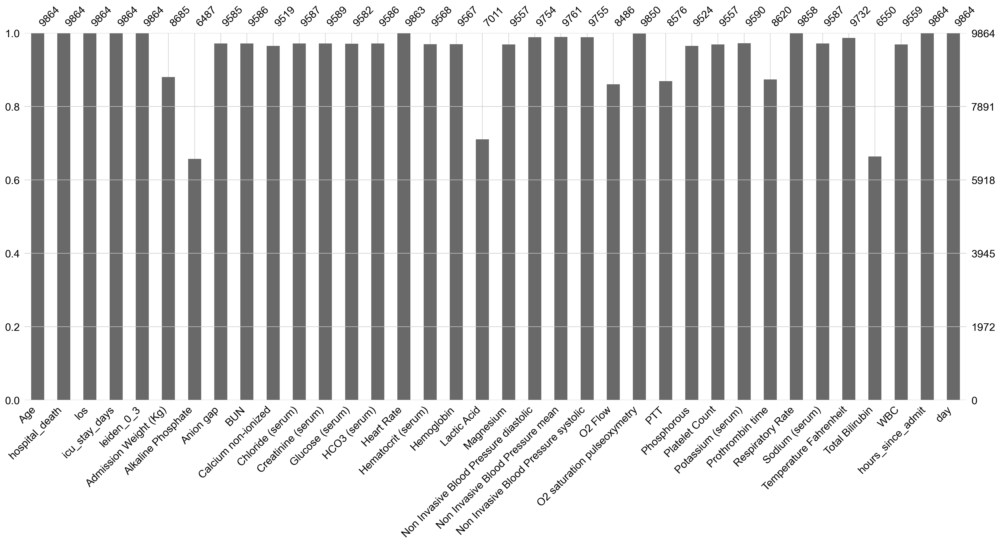

In [147]:
ep.pl.missing_values_barplot(adata_per_patient)

In [154]:
adata.obs["stay_id"] = adata.obs.index


In [406]:
#ep.pp.winsorize(adata)

adata.describe()

In [31]:
adata

AnnData object with n_obs × n_vars = 1981901 × 36
    obs: 'subject_id', 'hadm_id', 'dod', 'intime', 'outtime', 'ALT', 'AST', 'ICD_J18', 'ICD_E87', 'ICD_I50', 'ICD_N17', 'ICD_J96', 'gender', 'insurance', 'ethnicity', 'annotation', 'missing_values_abs', 'missing_values_pct', 'stay_id'
    var: 'feature_type', 'missing_values_abs', 'missing_values_pct', 'mean', 'median', 'standard_deviation', 'min', 'max', 'iqr_outliers'
    layers: 'original'

In [155]:
adata.obs["hour"] = np.floor(adata[:, "hours_since_admit"].X)

# Truncate everything beyond hour 47
adata = adata[adata.obs["hour"] < 48, :] # 48


In [156]:
data_median_hour = (
    ep.ad.anndata_to_df(adata, obs_cols=["hour", "stay_id"])
    .groupby(["stay_id", "hour"])[variables_mort]
    .median()
)


KeyError: "Columns not found: 'leiden_0_3'"

In [126]:
# adata.obs["hour"] = np.floor(adata[:, "hours_since_admit"].X)
# # data goes until h = 48, change 48 to 47
# adata.obs["hour"][adata.obs["hour"] == 48] = 47


# data_median_hour = (
#     ep.ad.anndata_to_df(adata, obs_cols=["hour", "stay_id"])
#     .groupby(["stay_id", "hour"])[variables_mort]
#     .median()
# )

The ‘groupby’ will create as many indexes as groups defined. In order to facilitate the next operations, a single index is desirable. In the next example, the second index (column ‘hour’) is excluded and kept as a DataFrame column. Note that the first index corresponds to level 0 and second index to level 1. Therefore, in order to exclude the second index and keep it as a column, ‘level’ should be set to 1 and ‘drop’ to False.

In [34]:
data_median_hour = data_median_hour.reset_index(level=(1), drop=False)

In [35]:
data_median_hour


,hour,Alkaline Phosphate,Anion gap,BUN,Calcium non-ionized,Chloride (serum),Creatinine (serum),Glucose (serum),HCO3 (serum),Heart Rate,...,Platelet Count,Potassium (serum),Prothrombin time,Respiratory Rate,Sodium (serum),Temperature Fahrenheit,Total Bilirubin,WBC,hospital_death,leiden_0_3
stay_id,,,,,,,,,,,,,,,,,,,,,
30000484,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,14.8,NaN,NaN,NaN,NaN,NaN,0.0,1.0
30000484,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,102.5,...,NaN,NaN,NaN,19.0,NaN,96.000000,NaN,NaN,0.0,1.0
30000484,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88.0,...,NaN,NaN,NaN,14.0,NaN,NaN,NaN,NaN,0.0,1.0
30000484,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,87.0,...,NaN,NaN,NaN,13.0,NaN,NaN,NaN,NaN,0.0,1.0
30000484,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92.0,...,NaN,NaN,NaN,18.0,NaN,NaN,NaN,NaN,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39999230,19.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,103.0,...,NaN,NaN,NaN,24.0,NaN,98.300003,NaN,NaN,0.0,1.0
39999230,20.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,103.0,...,NaN,NaN,NaN,19.0,NaN,NaN,NaN,NaN,0.0,1.0
39999230,21.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,106.0,...,NaN,NaN,NaN,26.0,NaN,98.400002,NaN,NaN,0.0,1.0


In [36]:
data_median_hour.index = data_median_hour.index.astype(int)


In [104]:
# Check the type of index
print(data_median_hour.index.dtype)


int32


In [133]:
print(type(ICUstayID))


<class 'int'>


In [134]:
print(data_median_hour["hour"].dtype)


float32


In [37]:
data_median_hour["hour"] = pd.to_numeric(data_median_hour["hour"], errors="coerce")


In [136]:
print(data_median_hour["hour"].dtype)

float32


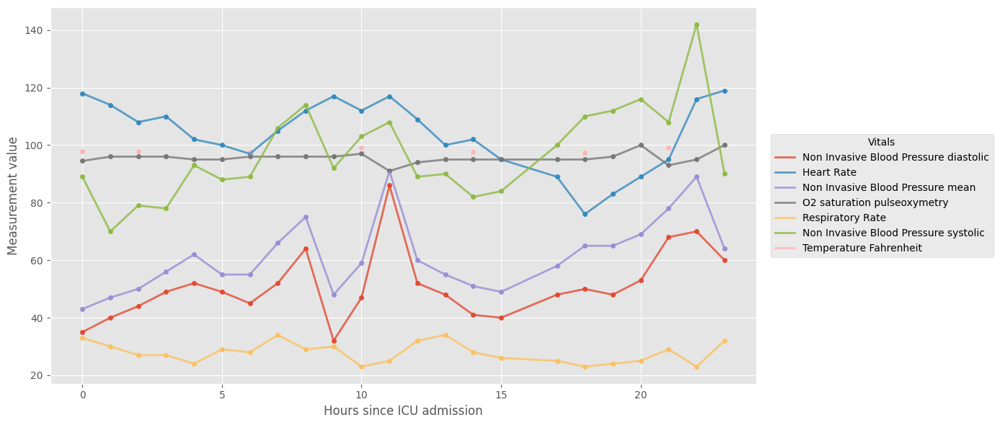

In [38]:
vitals = [
    "Non Invasive Blood Pressure diastolic",
    "Heart Rate",
    "Non Invasive Blood Pressure mean",
    "O2 saturation pulseoxymetry",
    "Respiratory Rate",
    "Non Invasive Blood Pressure systolic",
    "Temperature Fahrenheit",
]
ICUstayID = 30005362

fig, ax = plt.subplots(figsize=(14, 6))

# Plot all lines and scatter in one loop
for col in vitals:
    x = data_median_hour.loc[ICUstayID, "hour"]
    y = data_median_hour.loc[ICUstayID, col]
    ax.plot(x, y, label=col, linewidth=2, alpha=0.8)
    ax.scatter(x, y, s=20)

# Axis labels
plt.xlabel("Hours since ICU admission")
plt.ylabel("Measurement value")

# Clean legend off to the side
plt.legend(
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    title="Vitals",
    borderaxespad=0,
    fontsize=10,
)

plt.tight_layout()
plt.show()


In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_cluster_trajectories(df, value_cols, group_col="leiden_0_3"):
    for var in value_cols:
        plt.figure(figsize=(8, 4))
        sns.lineplot(
            data=df.groupby([group_col, "hour"])[var].median().reset_index(),
            x="hour", y=var, hue=group_col, palette="tab10"
        )
        plt.title(f"{var} over time by {group_col}")
        plt.xlabel("Hours since ICU admission")
        plt.ylabel(var)
        plt.legend(title=group_col, bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()


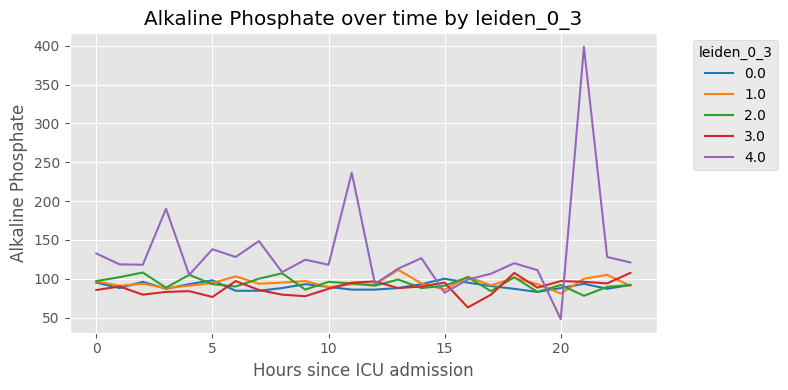

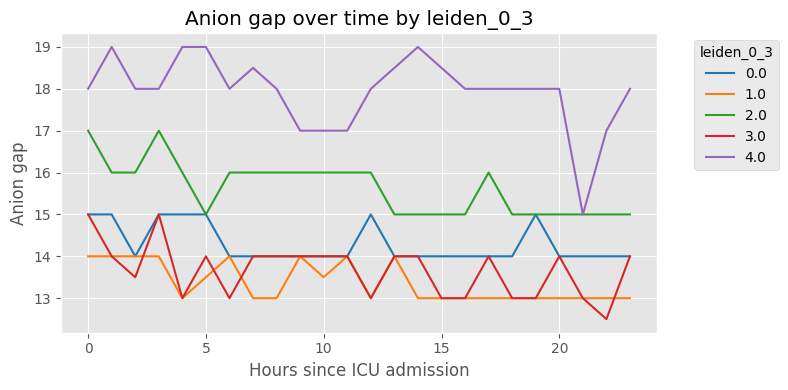

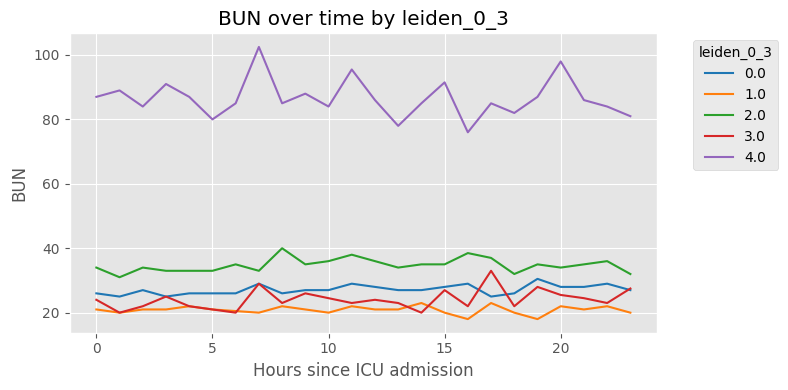

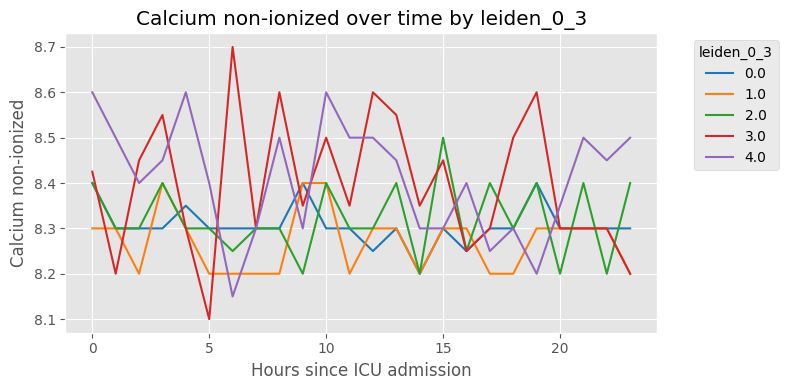

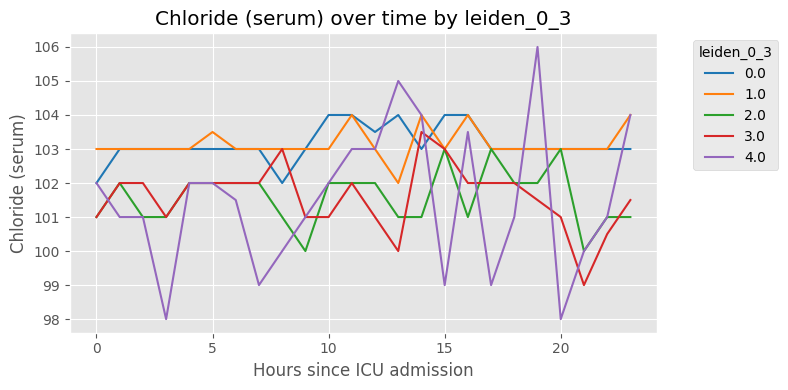

...

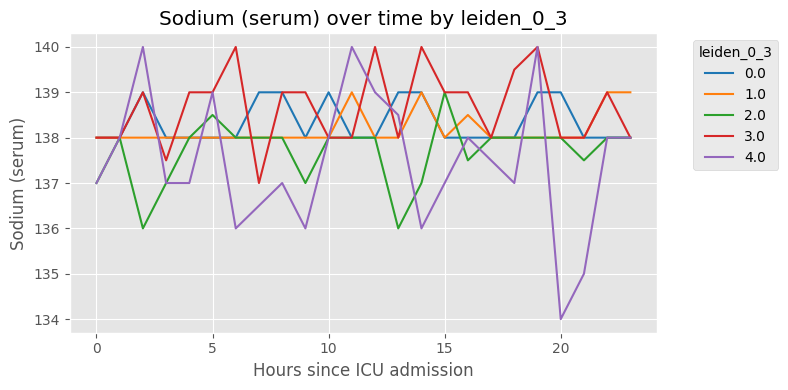

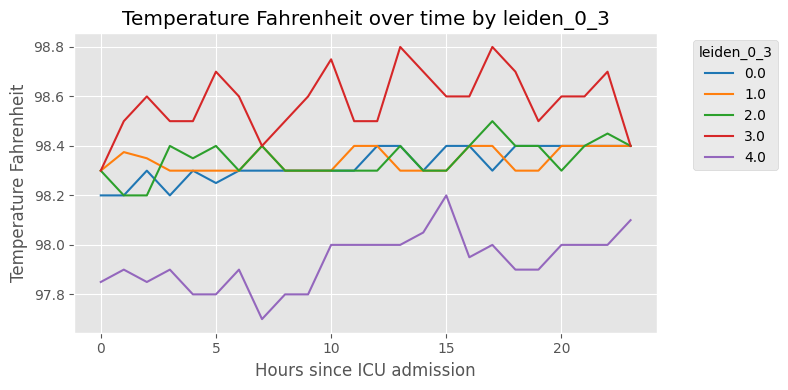

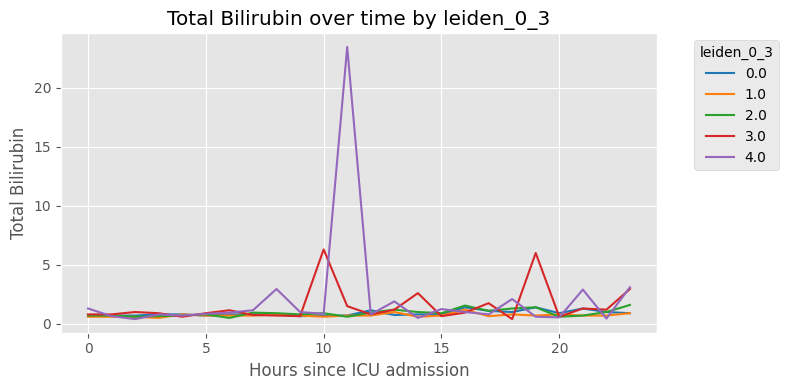

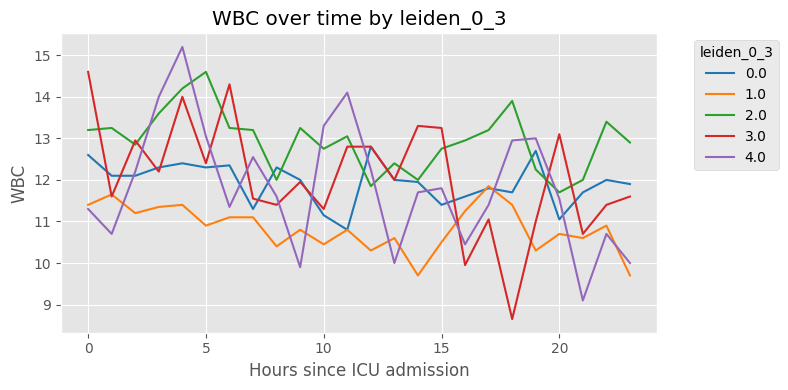

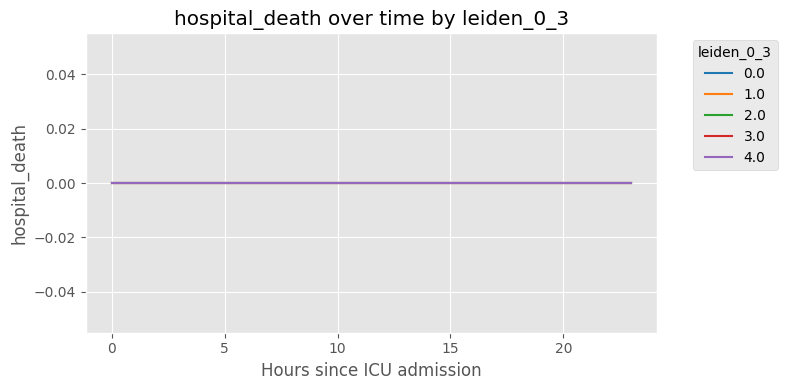

ValueError: cannot insert leiden_0_3, already exists

In [40]:
plot_cluster_trajectories(data_median_hour, variables_mort, group_col="leiden_0_3")


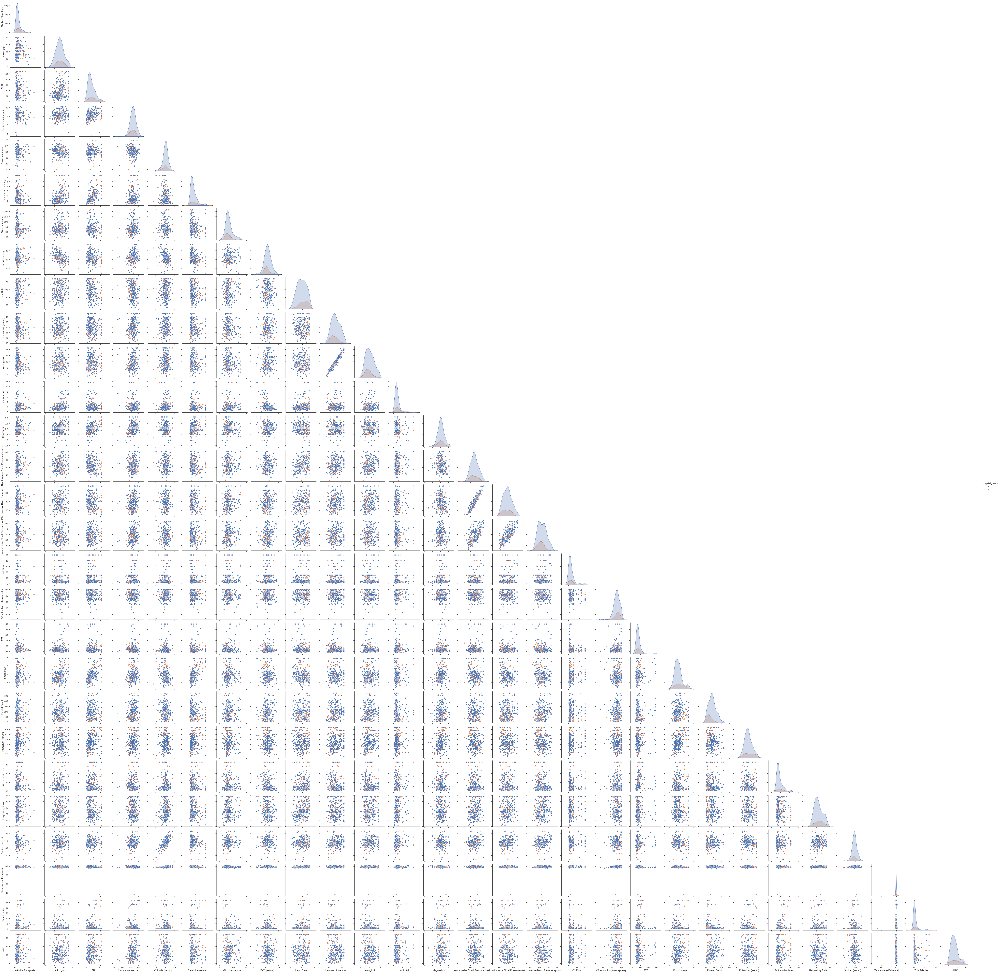

In [475]:
sns.set(style="ticks")
g = sns.pairplot(
    data_median_hour[variables_mort].dropna(axis=0, how="any"),
    vars=variables,
    hue="hospital_death",
)

# hide the upper triangle
for i, j in zip(*np.triu_indices_from(g.axes, 1)):
    g.axes[i, j].set_visible(False)
plt.show()

# change back to our preferred style
plt.style.use("ggplot")


In [41]:
def timeseries_data(data_median_hour, variable, filldata=1):
    """Return matrix of time series data for clustering,
    with rows corresponding to unique observations (ICU stays) and
    columns corresponding to time since ICU admission"""
    data4clustering = data_median_hour.pivot(columns="hour", values=variable)
    if filldata == 1:
        # first forward fill
        data4clustering = data4clustering.fillna(method="ffill", axis=1)
        # next backward fill
        data4clustering = data4clustering.fillna(method="bfill", axis=1)
        data4clustering = data4clustering.dropna(axis=0, how="all")
    return data4clustering

In [42]:
def feat_transf(data):
    data_max = data.groupby(["stay_id"])[variables].max()
    data_max.columns = ["max " + str(col) for col in data_max.columns]

    data_min = data.groupby(["stay_id"])[variables].min()
    data_min.columns = ["min " + str(col) for col in data_min.columns]

    data_sd = data.groupby(["stay_id"])[variables].std()
    data_sd.columns = ["sd " + str(col) for col in data_sd.columns]

    data_mean = data.groupby(["stay_id"])[variables].mean()
    data_mean.columns = ["mean " + str(col) for col in data_mean.columns]

    data_agg = pd.concat([data_min, data_max, data_sd, data_mean], axis=1)

    return data_agg


data_transf = feat_transf(data_median_hour).dropna(axis=0)

print("Extracted features: ")
display.display(data_transf.columns)
print("")
print(f"Number of ICU stays: {str(data_transf.shape[0])}")
print(f"Number of features: {str(data_transf.shape[1])}")

Extracted features: 


Index(['min Alkaline Phosphate', 'min Anion gap',
       'min BUN', 'min Calcium non-ionized',
       'min Chloride (serum)',
       'min Creatinine (serum)',
       'min Glucose (serum)', 'min HCO3 (serum)',
       'min Heart Rate', 'min Hematocrit (serum)',
       ...
       'mean PTT', 'mean Phosphorous',
       'mean Platelet Count',
       'mean Potassium (serum)',
       'mean Prothrombin time',
       'mean Respiratory Rate', 'mean Sodium (serum)',
       'mean Temperature Fahrenheit',
       'mean Total Bilirubin', 'mean WBC'],
      dtype='object', length=112)


Number of ICU stays: 318
Number of features: 112


In [43]:
hospital_death = data.loc[data_transf.index]["hospital_death"].groupby(["stay_id"]).mean()
age = data.loc[data_transf.index]["Age"].groupby(["stay_id"]).mean()
#gender = data.loc[data_transf.index]["gender"].groupby(["stay_id"]).mean()
cluster = data.loc[data_transf.index]["leiden_0_3"].groupby(["stay_id"]).mean()

data_transf_inv = pd.concat([data_transf, age, cluster, hospital_death], axis=1).dropna(
    axis=0
)
print(f"Number of ICU stays: {str(data_transf_inv.shape[0])}")
print(f"Number of features: {str(data_transf_inv.shape[1])}")

Number of ICU stays: 318
Number of features: 115


In [44]:
features_to_drop = ["hospital_death"]  # add more if needed
X = data_transf_inv.drop(columns=features_to_drop)
y = data_transf_inv[["hospital_death"]]


In [45]:
# your cluster label map
annotation_map = {
    0: "Renal-Metabolic",
    1: "Diabetic-Obese",
    2: "Severe-AKI-Acidosis",
    3: "Resp/Cardio",
    4: "Severe-CoInfection"
}

# map cluster IDs to phenotypes
data_transf_inv["annotation"] = data_transf_inv["leiden_0_3"].map(annotation_map)


In [46]:
X = data_transf_inv.drop(columns=["hospital_death"])
y = data_transf_inv[["hospital_death"]]


In [47]:
X = pd.get_dummies(X, columns=["annotation"])


In [48]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=10,
    stratify=y
)


In [49]:
data_transf_inv.head()
# should include: stay_id, annotation, hospital_death, etc.


,min Alkaline Phosphate,min Anion gap,min BUN,min Calcium non-ionized,min Chloride (serum),min Creatinine (serum),min Glucose (serum),min HCO3 (serum),min Heart Rate,min Hematocrit (serum),...,mean Prothrombin time,mean Respiratory Rate,mean Sodium (serum),mean Temperature Fahrenheit,mean Total Bilirubin,mean WBC,Age,leiden_0_3,hospital_death,annotation
stay_id,,,,,,,,,,,,,,,,,,,,,
30000831,164.0,14.0,65.0,8.9,102.0,2.1,126.0,24.0,80.0,38.000000,...,13.600000,26.770834,144.333328,99.577782,0.450000,17.750000,78.0,4.0,0.0,Severe-CoInfection
30055228,103.0,12.0,56.0,8.1,98.0,1.8,135.0,27.0,72.0,43.299999,...,24.400002,17.375000,142.250000,97.516663,0.650000,10.900000,65.0,0.0,0.0,Renal-Metabolic
30085141,177.0,18.0,108.0,8.8,88.0,1.4,115.0,21.0,100.0,21.500000,...,14.050000,21.083334,132.250000,97.900002,0.750000,11.300000,41.0,0.0,0.0,Renal-Metabolic
30089616,133.0,25.0,66.0,8.2,104.0,4.7,131.0,17.0,79.0,31.000000,...,14.100000,19.812500,142.666672,97.916664,1.200000,23.699999,50.0,1.0,1.0,Diabetic-Obese
30093376,666.0,13.0,29.0,7.9,91.0,0.4,84.0,21.0,103.0,19.600000,...,23.233332,12.750000,129.666672,98.099998,4.266666,5.433333,46.0,1.0,0.0,Diabetic-Obese


In [50]:
X_train

,min Alkaline Phosphate,min Anion gap,min BUN,min Calcium non-ionized,min Chloride (serum),min Creatinine (serum),min Glucose (serum),min HCO3 (serum),min Heart Rate,min Hematocrit (serum),...,mean Temperature Fahrenheit,mean Total Bilirubin,mean WBC,Age,leiden_0_3,annotation_Diabetic-Obese,annotation_Renal-Metabolic,annotation_Resp/Cardio,annotation_Severe-AKI-Acidosis,annotation_Severe-CoInfection
stay_id,,,,,,,,,,,,,,,,,,,,,
30973698,666.0,21.0,55.0,6.3,80.0,1.3,61.0,12.0,77.0,20.400000,...,98.042854,8.450000,22.666666,61.0,4.0,False,False,False,False,True
33429186,166.0,17.0,25.0,7.6,101.0,2.0,108.0,18.0,82.0,24.500000,...,97.866669,0.600000,9.080000,79.0,1.0,True,False,False,False,False
31952989,282.0,16.0,34.0,9.1,85.0,1.2,156.0,29.0,63.0,26.500000,...,98.049995,0.533333,16.500000,73.0,0.0,False,True,False,False,False
34866907,106.0,18.0,42.0,8.2,111.0,1.0,132.0,16.0,102.0,18.000000,...,98.294449,0.600000,24.025000,91.0,0.0,False,True,False,False,False
37738360,147.0,10.0,31.0,8.4,98.0,3.4,59.0,27.0,58.0,22.500000,...,97.942856,0.600000,4.100000,57.0,3.0,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36089708,141.5,11.0,16.0,8.1,101.0,1.5,92.0,8.5,98.0,23.250000,...,98.270004,1.550000,7.550000,53.0,1.0,True,False,False,False,False
35469955,104.0,15.0,81.0,7.2,98.0,3.6,89.0,16.0,93.0,23.100000,...,98.188889,23.950001,16.199999,72.0,0.0,False,True,False,False,False
34784026,99.0,17.0,19.0,9.5,113.0,5.2,111.0,13.0,77.0,22.000000,...,98.142860,27.200003,12.200001,45.0,0.0,False,True,False,False,False


In [51]:
def print_size(y_train, y_test):
    print(
        f"{str(len(y_train[y_train['hospital_death']==1]))} ( {str(round(len(y_train[y_train['hospital_death']==1])/len(y_train)*100,1))}%) non-survivors in training set"
    )
    print(
        f"{str(len(y_train[y_train['hospital_death']==0]))} ( {str(round(len(y_train[y_train['hospital_death']==0])/len(y_train)*100,1))}%) survivors in training set"
    )
    print(
        f"{str(len(y_test[y_test['hospital_death']==1]))} ( {str(round(len(y_test[y_test['hospital_death']==1])/len(y_test)*100,1))}%) non-survivors in test set"
    )
    print(
        f"{str(len(y_test[y_test['hospital_death']==0]))} ( {str(round(len(y_test[y_test['hospital_death']==0])/len(y_test)*100,1))}%) survivors in test set"
    )

In [54]:
# set the % of class 1 samples to be present in the training set.
perc_class1 = 0.4

print("Before balancing")
print_size(y_train, y_test)

if perc_class1 > 0:
    # Find the indices of class 0 and class 1 samples
    class0_indices = y_train[y_train["hospital_death"] == 0].index
    class1_indices = y_train[y_train["hospital_death"] == 1].index

    # Calculate the number of samples for the majority class (survivors)
    class0_size = round(
        int(
            (len(y_train[y_train["hospital_death"] == 1]) * (1 - perc_class1)) / perc_class1
        ),
        0,
    )

    # Set the random seed generator for reproducibility
    np.random.seed(10)

    # Random sample majority class indices
    random_indices = np.random.choice(class0_indices, class0_size, replace=False)

    # Concat class 0 with class 1 indices
    X_train = pd.concat([X_train.loc[random_indices], X_train.loc[class1_indices]])
    y_train = pd.concat([y_train.loc[random_indices], y_train.loc[class1_indices]])

    print("After balancing")
    print_size(y_train, y_test)

# Exclude output from input data
X_train = X_train.drop(columns=['leiden_0_3']) #"hospital_death", 
X_test = X_test.drop(columns=['leiden_0_3'])

Before balancing
69 ( 40.1%) non-survivors in training set
103 ( 59.9%) survivors in training set
17 ( 26.6%) non-survivors in test set
47 ( 73.4%) survivors in test set
After balancing
69 ( 40.1%) non-survivors in training set
103 ( 59.9%) survivors in training set
17 ( 26.6%) non-survivors in test set
47 ( 73.4%) survivors in test set


The attribute ‘labels_’ gives the cluster labels indicating to which cluster each observation belongs, and ‘cluster_centers_’ gives the coordinates of cluster centers representing the mean of all observations in the cluster. Using these two attributes it is possible to plot the clusters centers and the data in each cluster using different colors do distinguish the clusters:

In [55]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from sklearn.model_selection import cross_val_score

# Train the model
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train["hospital_death"])

# Predict on test set
y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)[:, 1]  # for AUC

# Evaluation
print("Classification Report:\n", classification_report(y_test["hospital_death"], y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test["hospital_death"], y_pred))
print("ROC AUC:", roc_auc_score(y_test["hospital_death"], y_prob))


Classification Report:
               precision    recall  f1-score   support

         0.0       0.81      0.91      0.86        47
         1.0       0.64      0.41      0.50        17

    accuracy                           0.78        64
   macro avg       0.72      0.66      0.68        64
weighted avg       0.76      0.78      0.76        64

Confusion Matrix:
 [[43  4]
 [10  7]]
ROC AUC: 0.6927409261576971


In [56]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score
import pandas as pd

# 1. Define target
y = data_transf_inv["hospital_death"]

# 2. Define input feature sets
X_cluster_only = data_transf_inv[["leiden_0_3"]]  # numeric cluster ID

X_features_only = data_transf_inv.drop(columns=["hospital_death", "leiden_0_3", "annotation"], errors="ignore")

X_all = data_transf_inv.drop(columns=["hospital_death"])

# 3. One-hot encode cluster annotation in the full feature set
X_all_encoded = pd.get_dummies(X_all, columns=["annotation"], drop_first=True)

# 4. Split function
def make_splits(X):
    return train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

X1_train, X1_test, y1_train, y1_test = make_splits(X_cluster_only)
X2_train, X2_test, y2_train, y2_test = make_splits(X_features_only)
X3_train, X3_test, y3_train, y3_test = make_splits(X_all_encoded)

# 5. Model training & evaluation
def run_model(X_train, X_test, y_train, y_test, label):
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)
    y_prob = model.predict_proba(X_test)[:, 1]
    auc = roc_auc_score(y_test, y_prob)
    print(f"{label} AUC: {auc:.3f}")
    return auc

# 6. Run all 3 models
auc1 = run_model(X1_train, X1_test, y1_train, y1_test, "Cluster only")
auc2 = run_model(X2_train, X2_test, y2_train, y2_test, "Features only")
auc3 = run_model(X3_train, X3_test, y3_train, y3_test, "Features + Cluster")


Cluster only AUC: 0.553
Features only AUC: 0.777
Features + Cluster AUC: 0.735


--- Cluster only ---
ROC AUC: 0.553
Classification Report:
               precision    recall  f1-score   support

         0.0       0.73      1.00      0.85        47
         1.0       0.00      0.00      0.00        17

    accuracy                           0.73        64
   macro avg       0.37      0.50      0.42        64
weighted avg       0.54      0.73      0.62        64

Confusion Matrix:
 [[47  0]
 [17  0]]
--- Features only ---
ROC AUC: 0.777
Classification Report:
               precision    recall  f1-score   support

         0.0       0.76      0.96      0.85        47
         1.0       0.60      0.18      0.27        17

    accuracy                           0.75        64
   macro avg       0.68      0.57      0.56        64
weighted avg       0.72      0.75      0.70        64

Confusion Matrix:
 [[45  2]
 [14  3]]
--- Features + Cluster ---
ROC AUC: 0.735
Classification Report:
               precision    recall  f1-score   support

         0.0       0.75     

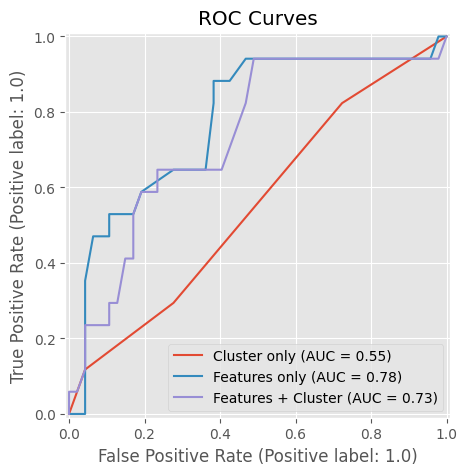

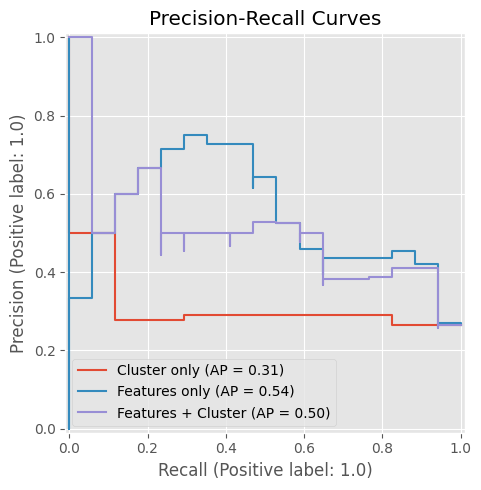

In [57]:
from sklearn.metrics import classification_report, confusion_matrix, RocCurveDisplay, PrecisionRecallDisplay
import matplotlib.pyplot as plt

def run_detailed_model(X_train, X_test, y_train, y_test, label, roc_ax=None, pr_ax=None):
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    # Basic metrics
    auc = roc_auc_score(y_test, y_prob)
    print(f"--- {label} ---")
    print("ROC AUC:", round(auc, 3))
    print("Classification Report:\n", classification_report(y_test, y_pred))
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
    
    # ROC Curve
    RocCurveDisplay.from_estimator(model, X_test, y_test, ax=roc_ax, name=label)

    # Precision-Recall Curve
    PrecisionRecallDisplay.from_estimator(model, X_test, y_test, ax=pr_ax, name=label)
    
    return auc

# Set up plots
fig_roc, ax_roc = plt.subplots(figsize=(7, 5))
fig_pr, ax_pr = plt.subplots(figsize=(7, 5))

# Run all 3 with extended output
auc1 = run_detailed_model(X1_train, X1_test, y1_train, y1_test, "Cluster only", roc_ax=ax_roc, pr_ax=ax_pr)
auc2 = run_detailed_model(X2_train, X2_test, y2_train, y2_test, "Features only", roc_ax=ax_roc, pr_ax=ax_pr)
auc3 = run_detailed_model(X3_train, X3_test, y3_train, y3_test, "Features + Cluster", roc_ax=ax_roc, pr_ax=ax_pr)

# Final touches to plots
ax_roc.set_title("ROC Curves")
ax_pr.set_title("Precision-Recall Curves")
plt.tight_layout()
plt.show()


In [58]:
from sklearn.metrics import ConfusionMatrixDisplay
import pandas as pd
import seaborn as sns

def run_detailed_model(X_train, X_test, y_train, y_test, label, roc_ax=None, pr_ax=None):
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    # Metrics
    auc = roc_auc_score(y_test, y_prob)
    report = classification_report(y_test, y_pred, output_dict=True)
    conf_matrix = confusion_matrix(y_test, y_pred)

    print(f"--- {label} ---")
    print("ROC AUC:", round(auc, 3))
    print("Classification Report:\n", classification_report(y_test, y_pred))
    print("Confusion Matrix:\n", conf_matrix)

    # ROC + PR Curves
    RocCurveDisplay.from_estimator(model, X_test, y_test, ax=roc_ax, name=label)
    PrecisionRecallDisplay.from_estimator(model, X_test, y_test, ax=pr_ax, name=label)

    return auc, pd.DataFrame(report).transpose(), conf_matrix


In [59]:
auc3, report_df, cmatrix = run_detailed_model(X3_train, X3_test, y3_train, y3_test, "Features + Cluster", roc_ax=ax_roc, pr_ax=ax_pr)


--- Features + Cluster ---
ROC AUC: 0.735
Classification Report:
               precision    recall  f1-score   support

         0.0       0.75      0.96      0.84        47
         1.0       0.50      0.12      0.19        17

    accuracy                           0.73        64
   macro avg       0.62      0.54      0.52        64
weighted avg       0.68      0.73      0.67        64

Confusion Matrix:
 [[45  2]
 [15  2]]


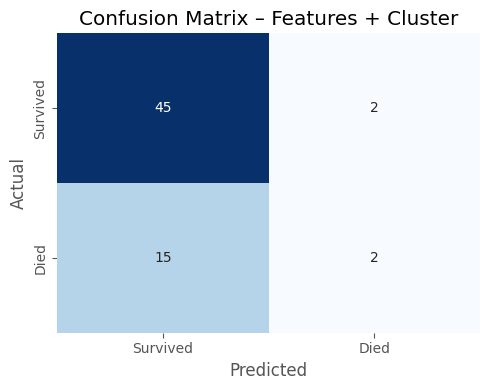

In [60]:
fig_cm, ax_cm = plt.subplots(figsize=(5, 4))
sns.heatmap(cmatrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=["Survived", "Died"], yticklabels=["Survived", "Died"])
ax_cm.set_xlabel("Predicted")
ax_cm.set_ylabel("Actual")
ax_cm.set_title("Confusion Matrix – Features + Cluster")
plt.tight_layout()
plt.show()


In [61]:
display(report_df.round(2))


TypeError: 'module' object is not callable

In [62]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import roc_auc_score
from xgboost import XGBClassifier
import pandas as pd

# 1. Define target
y = data_transf_inv["hospital_death"]

# 2. Define input feature sets
X_cluster_only = data_transf_inv[["leiden_0_3"]]
X_features_only = data_transf_inv.drop(columns=["hospital_death", "leiden_0_3", "annotation"], errors="ignore")
X_all = data_transf_inv.drop(columns=["hospital_death"])
X_all_encoded = pd.get_dummies(X_all, columns=["annotation"], drop_first=True)

# 3. Split function
def make_splits(X):
    return train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

X1_train, X1_test, y1_train, y1_test = make_splits(X_cluster_only)
X2_train, X2_test, y2_train, y2_test = make_splits(X_features_only)
X3_train, X3_test, y3_train, y3_test = make_splits(X_all_encoded)

# 4. Model runners
def run_rf_grid(X_train, X_test, y_train, y_test, label):
    print(f"🔍 GridSearchCV for {label}")
    param_grid = {
        "n_estimators": [100, 200],
        "max_depth": [None, 5, 10],
        "min_samples_split": [2, 5]
    }
    grid = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=3, scoring="roc_auc", n_jobs=-1)
    grid.fit(X_train, y_train)
    best_model = grid.best_estimator_
    y_prob = best_model.predict_proba(X_test)[:, 1]
    auc = roc_auc_score(y_test, y_prob)
    print(f"{label} AUC: {auc:.3f} | Best Params: {grid.best_params_}")
    return auc

def run_xgb(X_train, X_test, y_train, y_test, label):
    print(f"⚡ XGBoost for {label}")
    model = XGBClassifier(use_label_encoder=False, eval_metric="logloss", random_state=42)
    model.fit(X_train, y_train)
    y_prob = model.predict_proba(X_test)[:, 1]
    auc = roc_auc_score(y_test, y_prob)
    print(f"{label} AUC (XGBoost): {auc:.3f}")
    return auc

def run_nn(X_train, X_test, y_train, y_test, label):
    print(f"🧠 Neural Net for {label}")
    model = MLPClassifier(hidden_layer_sizes=(64, 32), max_iter=500, random_state=42)
    model.fit(X_train, y_train)
    y_prob = model.predict_proba(X_test)[:, 1]
    auc = roc_auc_score(y_test, y_prob)
    print(f"{label} AUC (NN): {auc:.3f}")
    return auc

# 5. Run all models for Features + Cluster (X3)
print("\n🧪 Running models on: Features + Cluster")
auc_rf = run_rf_grid(X3_train, X3_test, y3_train, y3_test, "RF + GridSearch")
auc_xgb = run_xgb(X3_train, X3_test, y3_train, y3_test, "XGBoost")
auc_nn = run_nn(X3_train, X3_test, y3_train, y3_test, "Neural Net")



🧪 Running models on: Features + Cluster
🔍 GridSearchCV for RF + GridSearch
RF + GridSearch AUC: 0.750 | Best Params: {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 200}
⚡ XGBoost for XGBoost
XGBoost AUC (XGBoost): 0.673
🧠 Neural Net for Neural Net
Neural Net AUC (NN): 0.638



🧪 Running models on: Features + Cluster


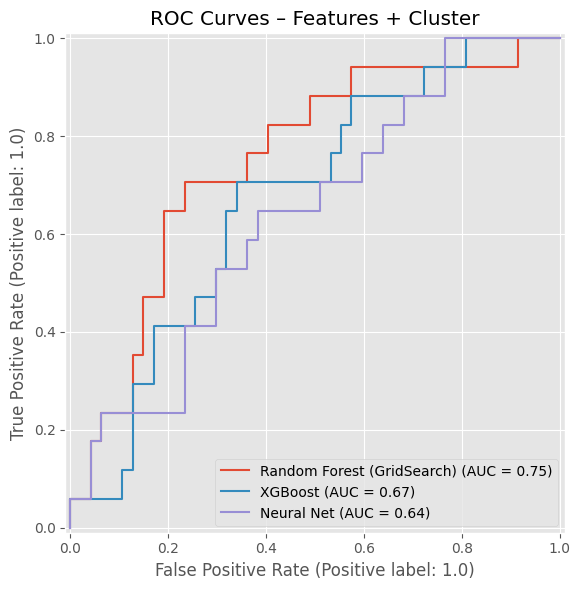

In [63]:
from sklearn.metrics import RocCurveDisplay
import matplotlib.pyplot as plt

# 1. Train + save models
# Store trained models
print("\n🧪 Running models on: Features + Cluster")
# RF with grid search
param_grid = {
    "n_estimators": [100, 200],
    "max_depth": [None, 5, 10],
    "min_samples_split": [2, 5]
}
rf_grid = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=3, scoring="roc_auc", n_jobs=-1)
rf_grid.fit(X3_train, y3_train)
rf_model = rf_grid.best_estimator_

# XGBoost
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric="logloss", random_state=42)
xgb_model.fit(X3_train, y3_train)

# Neural net
nn_model = MLPClassifier(hidden_layer_sizes=(64, 32), max_iter=500, random_state=42)
nn_model.fit(X3_train, y3_train)

# 2. Plot ROC curves
fig, ax = plt.subplots(figsize=(8, 6))

RocCurveDisplay.from_estimator(rf_model, X3_test, y3_test, ax=ax, name="Random Forest (GridSearch)")
RocCurveDisplay.from_estimator(xgb_model, X3_test, y3_test, ax=ax, name="XGBoost")
RocCurveDisplay.from_estimator(nn_model, X3_test, y3_test, ax=ax, name="Neural Net")

ax.set_title("ROC Curves – Features + Cluster")
plt.tight_layout()
plt.show()


In [64]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def run_rf_grid(X_train, X_test, y_train, y_test, label):
    print(f"🔍 GridSearchCV for {label}")
    param_grid = {
        "n_estimators": [100, 200],
        "max_depth": [None, 5, 10],
        "min_samples_split": [2, 5]
    }
    grid = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=3, scoring="roc_auc", n_jobs=-1)
    grid.fit(X_train, y_train)
    best_model = grid.best_estimator_
    
    y_pred = best_model.predict(X_test)
    y_prob = best_model.predict_proba(X_test)[:, 1]
    auc = roc_auc_score(y_test, y_prob)
    
    print(f"{label} AUC: {auc:.3f} | Best Params: {grid.best_params_}")
    print("\nClassification Report:\n", classification_report(y_test, y_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=["Survived", "Died"],
                yticklabels=["Survived", "Died"])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix – {label}")
    plt.show()
    
    return best_model  # return if you want to reuse the model elsewhere


🔍 GridSearchCV for RF + GridSearch
RF + GridSearch AUC: 0.750 | Best Params: {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 200}

Classification Report:
               precision    recall  f1-score   support

         0.0       0.74      0.98      0.84        47
         1.0       0.50      0.06      0.11        17

    accuracy                           0.73        64
   macro avg       0.62      0.52      0.47        64
weighted avg       0.68      0.73      0.65        64



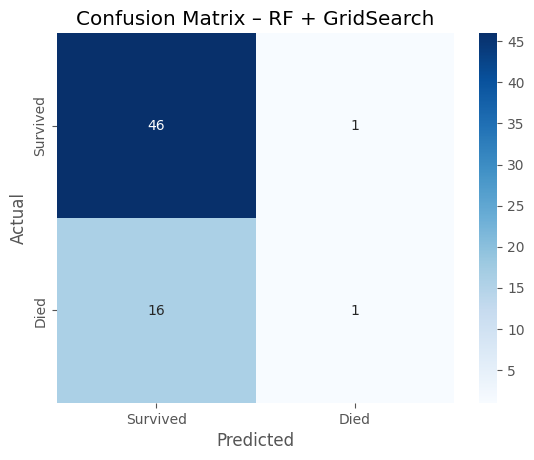

In [65]:
rf_model = run_rf_grid(X3_train, X3_test, y3_train, y3_test, "RF + GridSearch")


In [66]:
from sklearn.model_selection import GridSearchCV

params = {
    "n_estimators": [100, 200],
    "max_depth": [None, 5, 10],
    "min_samples_split": [2, 5],
}
grid = GridSearchCV(RandomForestClassifier(random_state=42), params, cv=5)
grid.fit(X_train, y_train["hospital_death"])


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
             param_grid={'max_depth': [None, 5, 10],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200]})

In [67]:
print("Best Params:", grid.best_params_)
print("Best CV Score (default = accuracy):", grid.best_score_)
best_model = grid.best_estimator_


Best Params: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}
Best CV Score (default = accuracy): 0.65109243697479


In [68]:
y_pred = best_model.predict(X_test)
y_prob = best_model.predict_proba(X_test)[:, 1]

from sklearn.metrics import classification_report, roc_auc_score
print(classification_report(y_test["hospital_death"], y_pred))
print("ROC AUC:", roc_auc_score(y_test["hospital_death"], y_prob))


              precision    recall  f1-score   support

         0.0       0.81      0.91      0.86        47
         1.0       0.64      0.41      0.50        17

    accuracy                           0.78        64
   macro avg       0.72      0.66      0.68        64
weighted avg       0.76      0.78      0.76        64

ROC AUC: 0.6927409261576971


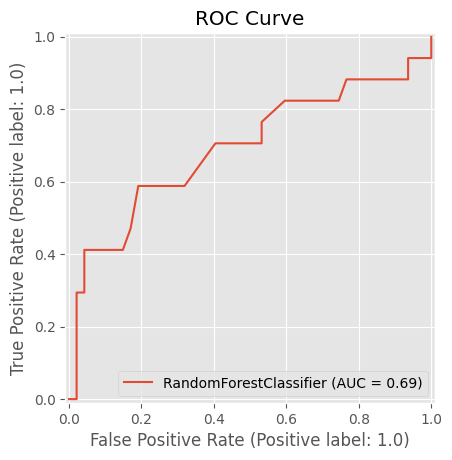

In [69]:
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(model, X_test, y_test["hospital_death"])
plt.title("ROC Curve")
plt.show()


In [439]:
print(X_train.index.dtype)
print(cluster_df.index.dtype)


int32
int64


In [292]:
X_train

,min Alkaline Phosphate,min Anion gap,min BUN,min Calcium non-ionized,min Chloride (serum),min Creatinine (serum),min Glucose (serum),min HCO3 (serum),min Heart Rate,min Hematocrit (serum),...,mean Potassium (serum),mean Prothrombin time,mean Respiratory Rate,mean Sodium (serum),mean Temperature Fahrenheit,mean Total Bilirubin,mean WBC,Age,annotation_x,annotation_y


In [440]:
import shap

# Rebuild explainer and shap values to be safe
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

# Extract class 1 (death) SHAP values
shap_values_class1 = shap_values[1]

# Check shape again
print("SHAP shape:", shap_values_class1.shape)
print("X_test shape:", X_test.shape)


SHAP shape: (119, 2)
X_test shape: (1973, 119)


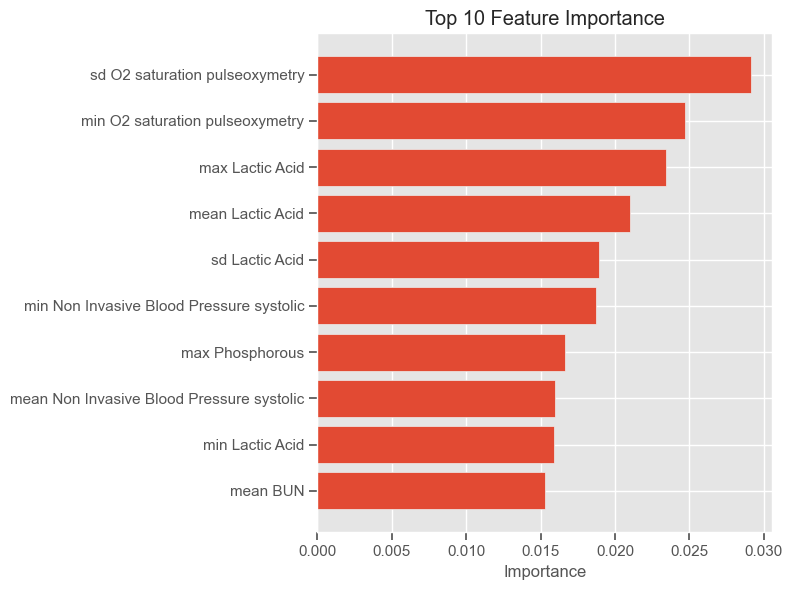

In [443]:
import pandas as pd
import matplotlib.pyplot as plt

# Get feature importances
importances = model.feature_importances_
features = X_train.columns

# Put in a DataFrame and sort
feat_imp = pd.DataFrame({"feature": features, "importance": importances})
feat_imp = feat_imp.sort_values(by="importance", ascending=False)

# Plot top 20
plt.figure(figsize=(8, 6))
plt.barh(feat_imp["feature"][:10][::-1], feat_imp["importance"][:10][::-1])
plt.title("Top 10 Feature Importance")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()



In [265]:
# Assuming you have these from earlier
# cluster_df = DataFrame with stay_id, leiden_0_3 and/or annotation

# Add to X sets
X_train = X_train.merge(cluster_df[["leiden_0_3"]], left_index=True, right_index=True)
X_test = X_test.merge(cluster_df[["leiden_0_3"]], left_index=True, right_index=True)


In [266]:
X_train

,min Alkaline Phosphate,min Anion gap,min BUN,min Calcium non-ionized,min Chloride (serum),min Creatinine (serum),min Glucose (serum),min HCO3 (serum),min Heart Rate,min Hematocrit (serum),...,mean Potassium (serum),mean Prothrombin time,mean Respiratory Rate,mean Sodium (serum),mean Temperature Fahrenheit,mean Total Bilirubin,mean WBC,Age,leiden_0_3_x,leiden_0_3_y


In [234]:
X_train.describe()

,min Alkaline Phosphate,min Anion gap,min BUN,min Calcium non-ionized,min Chloride (serum),min Creatinine (serum),min Glucose (serum),min HCO3 (serum),min Heart Rate,min Hematocrit (serum),...,mean Platelet Count,mean Potassium (serum),mean Prothrombin time,mean Respiratory Rate,mean Sodium (serum),mean Temperature Fahrenheit,mean Total Bilirubin,mean WBC,Age,leiden_0_3
count,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.00000,455.000000,455.000000,455.000000,...,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000
mean,125.786812,13.281319,34.176922,7.892857,98.889008,1.551758,108.06813,19.127472,73.071426,26.840111,...,171.855652,4.208005,19.860294,21.447733,137.496429,98.232094,3.650771,14.250614,62.276924,1.081319
std,100.239792,3.873407,23.712183,0.895177,7.128408,1.120664,35.29501,5.257071,17.912165,6.183180,...,114.257195,0.537862,7.797813,4.080581,5.065493,1.640015,6.252455,7.948116,15.897324,1.185440
min,21.000000,4.000000,2.000000,3.400000,70.000000,0.200000,13.00000,4.000000,0.000000,13.000000,...,8.500000,2.900000,10.500000,10.670213,120.000000,68.050003,0.100000,0.100000,19.000000,0.000000
25%,66.000000,11.000000,16.000000,7.400000,95.000000,0.800000,86.00000,16.000000,62.000000,21.900000,...,76.666664,3.800000,14.316666,18.578901,134.414284,97.837730,0.533333,8.617500,53.000000,0.000000
50%,98.000000,13.000000,28.000000,7.900000,99.000000,1.200000,102.00000,19.000000,72.000000,26.100000,...,160.333328,4.130000,17.199999,21.086956,137.333328,98.250000,1.100000,13.175000,63.000000,1.000000
75%,146.500000,16.000000,46.000000,8.500000,104.000000,1.850000,125.00000,22.000000,84.500000,31.000000,...,238.166664,4.562500,23.633333,24.109375,141.000000,98.757141,3.108333,18.050000,74.000000,2.000000
max,666.000000,25.000000,108.000000,10.300000,116.000000,6.300000,271.00000,37.000000,120.000000,43.400002,...,552.000000,5.700000,42.900005,33.097828,151.500000,101.500000,27.200003,34.000000,91.000000,4.000000


In [ ]:
variable = "leiden_0_3"
clusters = range(2, 6)

ids_clustering = X_train.index.unique()
for K in clusters:
    data4clustering, cluster_labels = clustering(variable, ids_clustering, K)

In [26]:
data = adata.to_df()
data.index = data.index.astype(int)

In [ ]:
ep.pp.summarize_measurements(adata)

In [ ]:
# Drop 'hours_since_admit' from .X if it's there
if "hours_since_admit" in adata.var_names:
    adata = adata[:, ~adata.var_names.isin(["hours_since_admit"])].copy()

# Floor the hour column and set it cleanly
adata.obs["hour"] = np.floor(adata.obs["hours_since_admit"]).astype(int)
adata.obs.loc[adata.obs["hour"] == 48, "hour"] = 47

# Now safely convert to DataFrame
df = ep.ad.anndata_to_df(adata, obs_cols=["hour", "stay_id"])

# Sanity check types
df["hour"] = df["hour"].astype(int)
df["stay_id"] = df["stay_id"].astype(str)

# Group by hour and stay_id
data_median_hour = df.groupby(["stay_id", "hour"])[variables_mort].median().reset_index()
